# Lesson 3: Basic Python for Data Analytics (Stocks Prediction)

# Introduction of Pandas


pandas is a DataFrame Framework, a library that stores data in a highly efficient spreadsheet format and functions.
Efficient in:
1. Data Structure (numpy)
2. Computing time (since DataFrame is processed by C++, it runs in a well streamlined computing environment)
3. Highly optimized and updated processes


[For more details of numpy](https://en.wikipedia.org/wiki/NumPy)

[For more details of pandas cookbook and 10 minutes basic](http://pandas.pydata.org/pandas-docs/stable/10min.html)

## Objective

* To use pandas to load the latest updated data from Yahoo Finance
* To explore and understand the dataset 
    * Viewing the data
    * Correlation Analysis
    * Graphing using matplotlib
* To predict the return of the stocks in the next period - Prediction analysis
    * Simple Linear Analysis
    * Quadratic Linear Analysis (QDA)
    * K Nearest Neighbor (KNN)
* Comparing models and discuss improvements
* Challenges:
    * Assuming economic qualitative factors such as news (news sourcing and sentimental analysis)
    * Assuming economic quantitative factors such as HPI of a certain country, economic inequality among origin of company
    * Cleaning out the data
    * Importing data files
* Next lesson:
    * Lesson 4 Basic Python for Data Analytics (Predicting Employee Retention)

## Loading YahooFinance Dataset

In this demonstration, we will use pandas web data reader. This is an extension of pandas library to communicate with most updated financial data. 

This will include sources as:
* Yahoo! Finance
* Google Finance
* Enigma
* FRED
* Fama/French
* World Bank
* OECD
* Eurostat
* EDGAR Index
* TSP Fund Data
* Oanda currency historical rate
* Nasdaq Trader Symbol Definitions

[For more details of pandas webreader](https://pandas-datareader.readthedocs.io/en/latest/)  

In [79]:
import sys
print (sys.prefix)

/usr


In [80]:
!pip install pandas
!pip show pandas_datareader
!pip install --upgrade pandas_datareader

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Name: pandas-datareader
Version: 0.10.0
Summary: Data readers extracted from the pandas codebase,should be compatible with recent pandas versions
Home-page: https://github.com/pydata/pandas-datareader
Author: The PyData Development Team
Author-email: pydata@googlegroups.com
License: BSD License
Location: /usr/local/lib/python3.7/dist-packages
Requires: lxml, requests, pandas
Required-by: 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [81]:
pip install pandas-datareader

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [82]:
!pip install yfinance
import yfinance as yf


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [83]:
ipsa = ['HLAG.DE','MAERSK-B.CO','VALE','INVERCAP.SN','SQM-B.SN','CHILE.SN','BSANTANDER.SN','COPEC.SN','CENCOSUD.SN','FALABELLA.SN','ENELAM.SN','CMPC.SN','BCI.SN','VAPORES.SN','CAP.SN','CCU.SN','ENELCHILE.SN','ANDINA-B.SN','CONCHATORO.SN','PARAUCO.SN','ITAUCORP.SN','AGUAS-A.SN','COLBUN.SN','CENCOSHOPP.SN','ENTEL.SN','MALLPLAZA.SN','IAM.SN','SMU.SN','ECL.SN','SONDA.SN','RIPLEY.SN','SECURITY.SN', 'QUINENCO.SN', 'BESALCO.SN','MASISA.SN', 'LTM.SN','ENJOY.SN']
ipsa2 = ['NVDA','AMD','TSLA', 'LMT','AMZN', 'FB']
accion_predecir = 'QUINENCO.SN'


In [84]:
import pandas as pd
import datetime
import pandas_datareader.data as web
from pandas import Series, DataFrame

#start = datetime.datetime(2002, 1, 1)
start = datetime.datetime(2000, 1, 1)
end = datetime.datetime(2022, 7, 8)

df = web.DataReader(accion_predecir, 'yahoo', start, end)
df.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2022-07-04,2205.0,2195.300049,2195.399902,2202.600098,906.0,2202.600098
2022-07-05,2200.0,2140.100098,2180.000000,2180.000000,166726.0,2180.000000
2022-07-06,2255.0,2196.000000,2196.000000,2196.000000,152308.0,2196.000000
2022-07-07,2225.0,2200.000000,2253.899902,2215.000000,2373433.0,2215.000000
2022-07-08,2280.0,2220.000000,2261.000000,2261.000000,22530.0,2261.000000


In [85]:
#CODIGO EN DESARROLLO

def acciones(accion_predecirs):
  df = accion_predecirs[0:-3]
  globals()[str(accion_predecirs.replace(".",""))] = web.DataReader(accion_predecirs, 'yahoo', start, end)
  return globals()[str(accion_predecirs).replace(".","")]
 
for i in ipsa:
  print("******************************************************************************")
  print(i)
  d = acciones(i)
  print(d)
  d.tail()
  print(d)

  print(type(d))
  print("dataframe name: "+str(d))
 

******************************************************************************
HLAG.DE
                  High         Low        Open       Close     Volume  \
Date                                                                    
2015-11-06   20.181255   19.785543   19.835009   19.993292  1775788.0   
2015-11-09   20.131790   19.859739   20.131790   19.924044    52918.0   
2015-11-10   20.240612   19.785543   19.933935   19.825115   236784.0   
2015-11-11   20.428574   19.513493   19.884472   19.736080  1004556.0   
2015-11-12   19.958668   19.686617   19.696508   19.785543    56239.0   
...                ...         ...         ...         ...        ...   
2022-07-04  245.199997  240.600006  243.000000  244.000000    12220.0   
2022-07-05  253.800003  240.000000  246.199997  248.600006    28810.0   
2022-07-06  256.799988  246.199997  249.000000  251.199997    39645.0   
2022-07-07  274.799988  251.000000  252.199997  272.399994    37202.0   
2022-07-08  281.799988  269.600006  2

Get the dimension of dataframe

In [86]:
'''
for i in ipsa:
  print("******************************************************************************")
  print(i)
  d = acciones(i)
  d.tail()
  print(d)
  print("******************************************************************************")

'''

'\nfor i in ipsa:\n  print("******************************************************************************")\n  print(i)\n  d = acciones(i)\n  d.tail()\n  print(d)\n  print("******************************************************************************")\n\n'

## Exploring the data 

First we will need to explore the data.
This means understanding the stocks data trend thoroughly by finding key measures
* rolling mean (moving average) -- to determine trend
* return deviation -- to determine return deviation

[For more details of rolling mean](http://www.investopedia.com/articles/active-trading/052014/how-use-moving-average-buy-stocks.asp) 


In [87]:
close_px = VAPORES['Adj Close']
mavg = close_px.rolling(window=100).mean()
mavg.tail(10)

Date
2022-06-24    89.316313
2022-06-28    89.441274
2022-06-29    89.566138
2022-06-30    89.684302
2022-07-01    89.788168
2022-07-04    89.861440
2022-07-05    89.976611
2022-07-06    90.083681
2022-07-07    90.256548
2022-07-08    90.431117
Name: Adj Close, dtype: float64

In [88]:

for i in ipsa:

  globals()["close_px_" + str(i).replace(".","")] = globals()[str(i).replace(".","")]['Adj Close']
  globals()["mavg" + str(i).replace(".","")] = close_px.rolling(window=100).mean()
  globals()["mavg" + str(i).replace(".","")].tail(10)

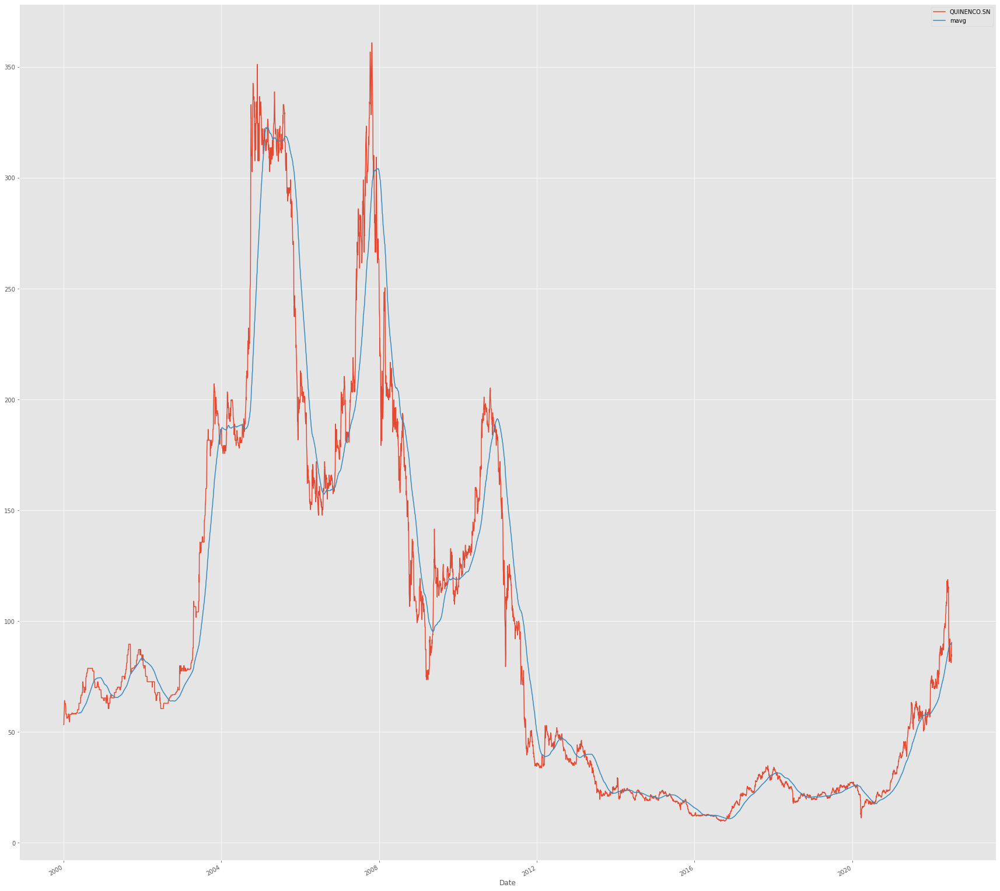

In [89]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import style

# Adjusting the size of matplotlib
import matplotlib as mpl
mpl.rc('figure', figsize=(30, 30))
mpl.__version__

# Adjusting the style of matplotlib
style.use('ggplot')

close_px.plot(label=accion_predecir)
mavg.plot(label='mavg')
plt.legend()

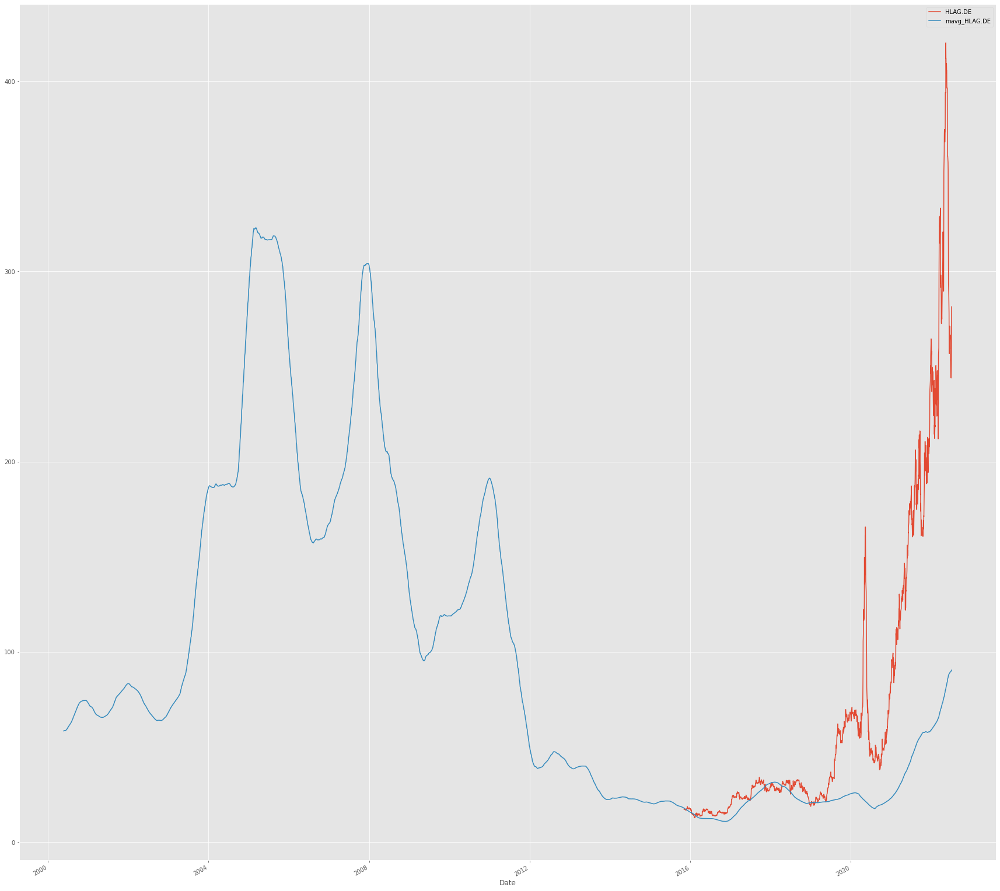

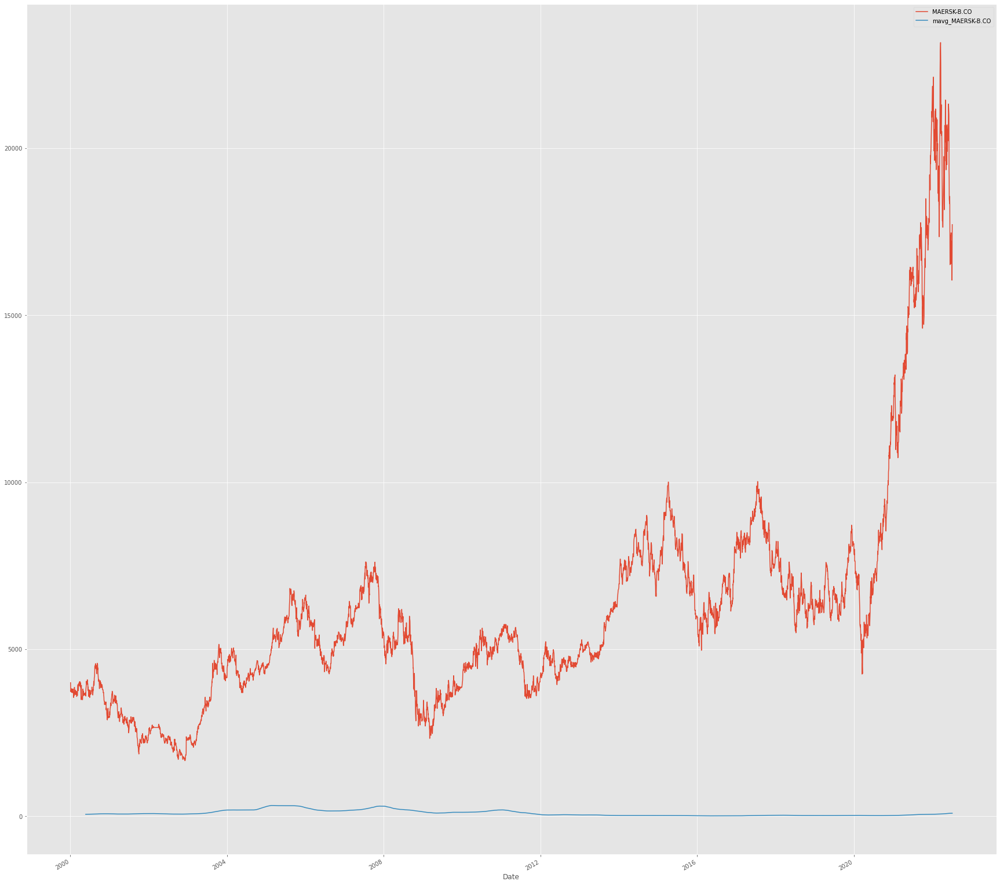

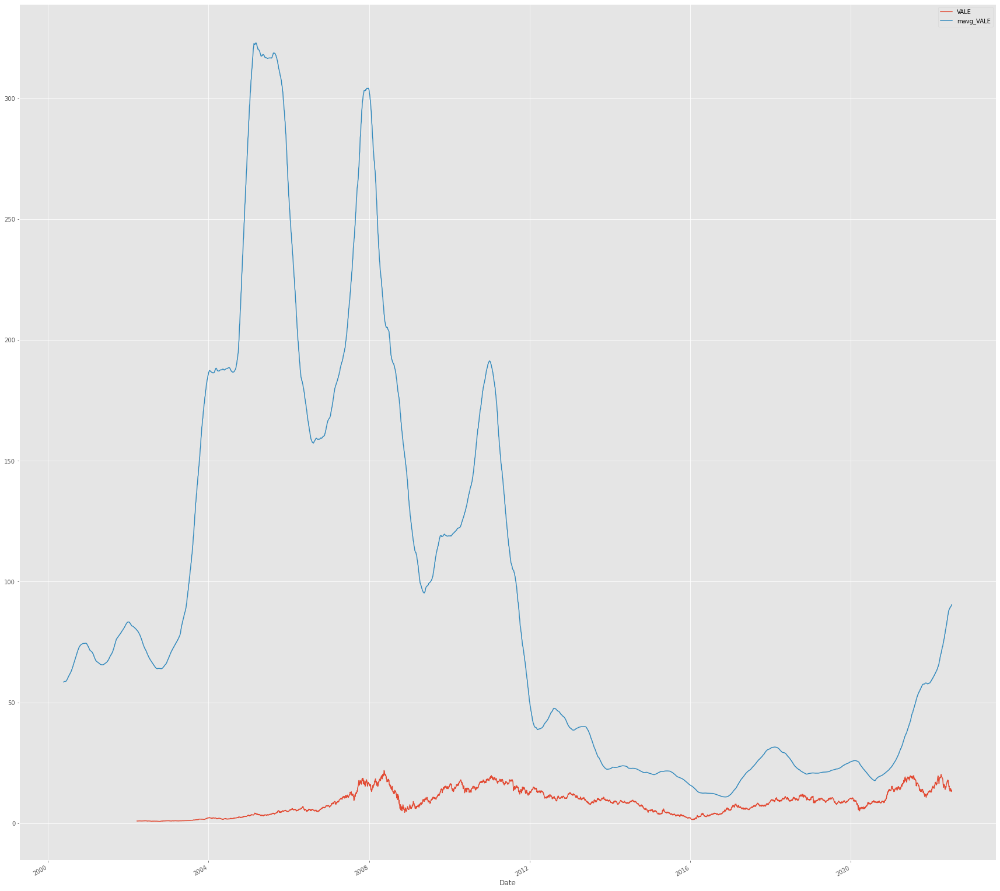

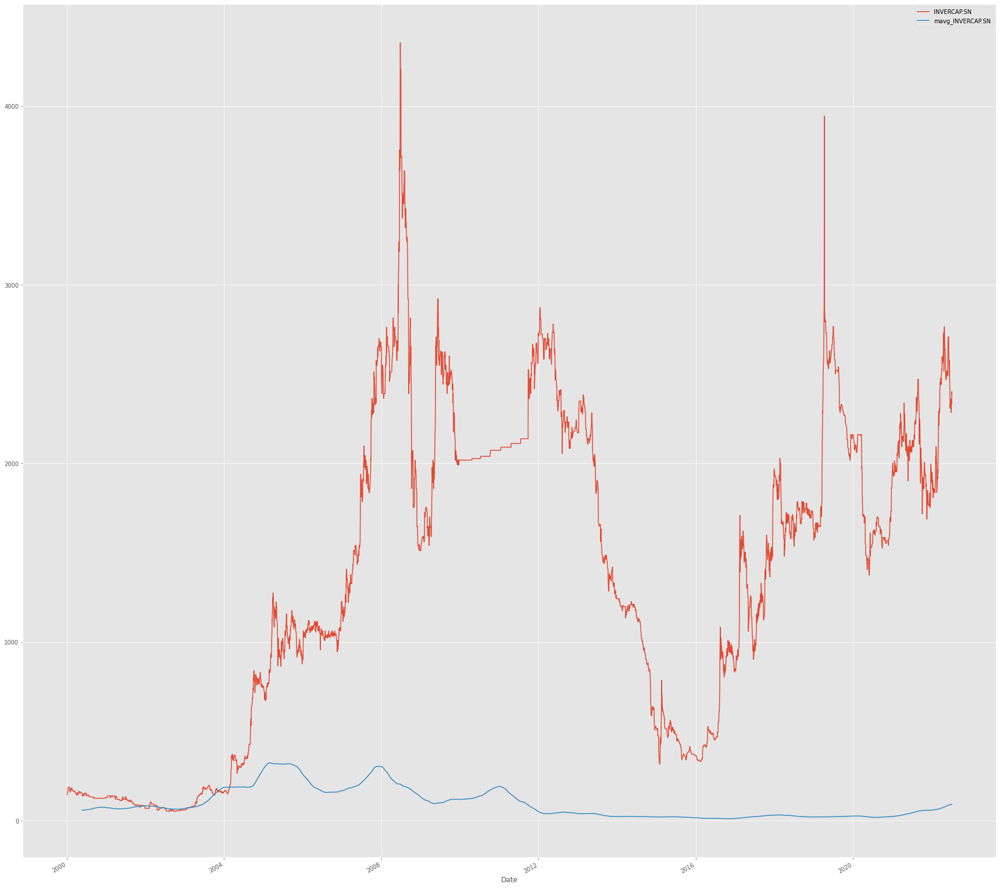

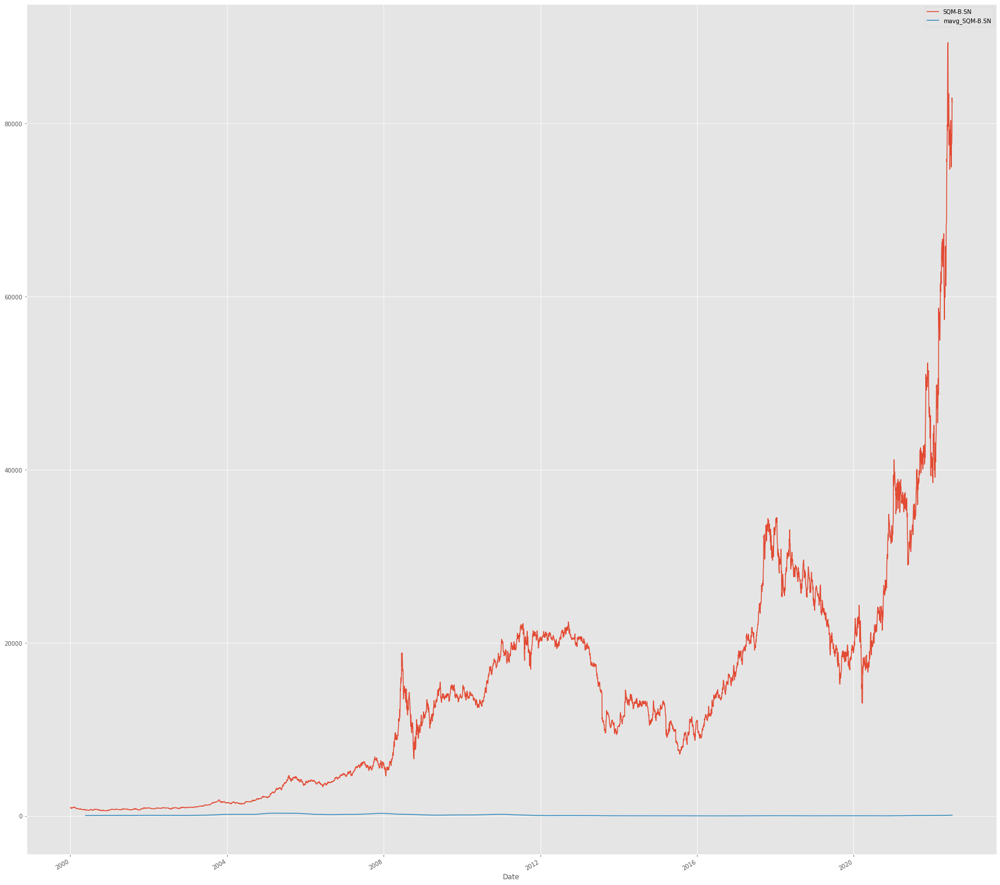

...

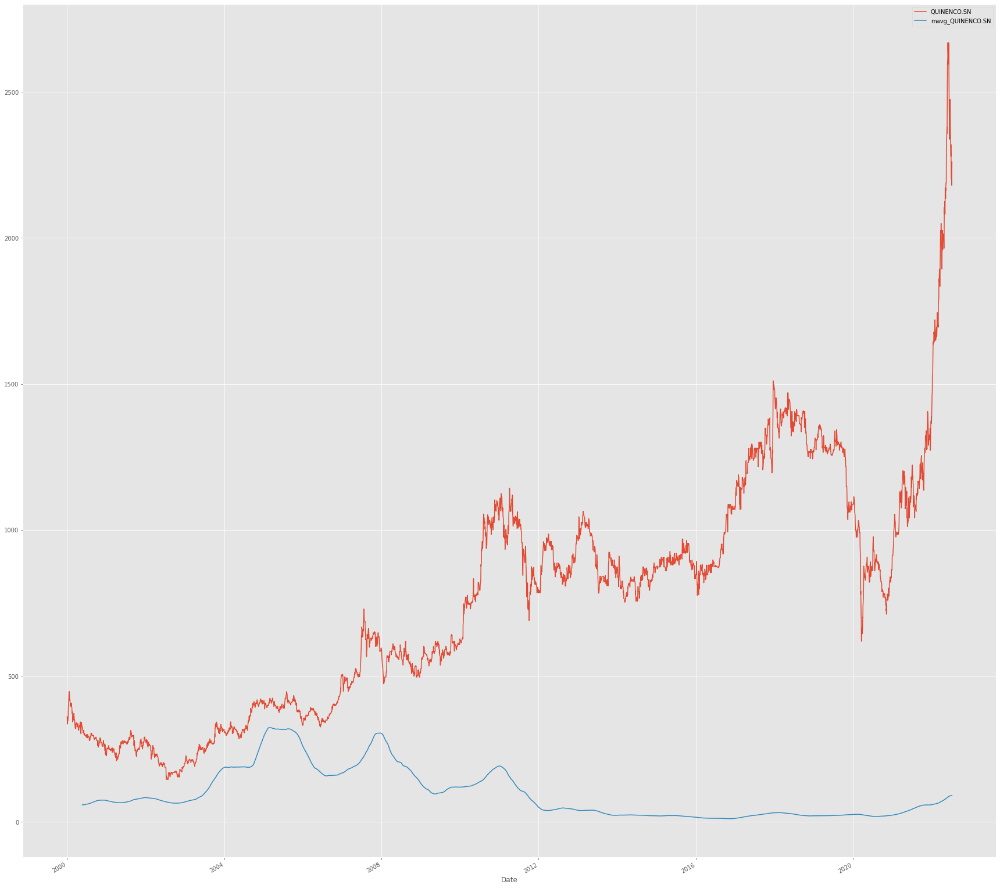

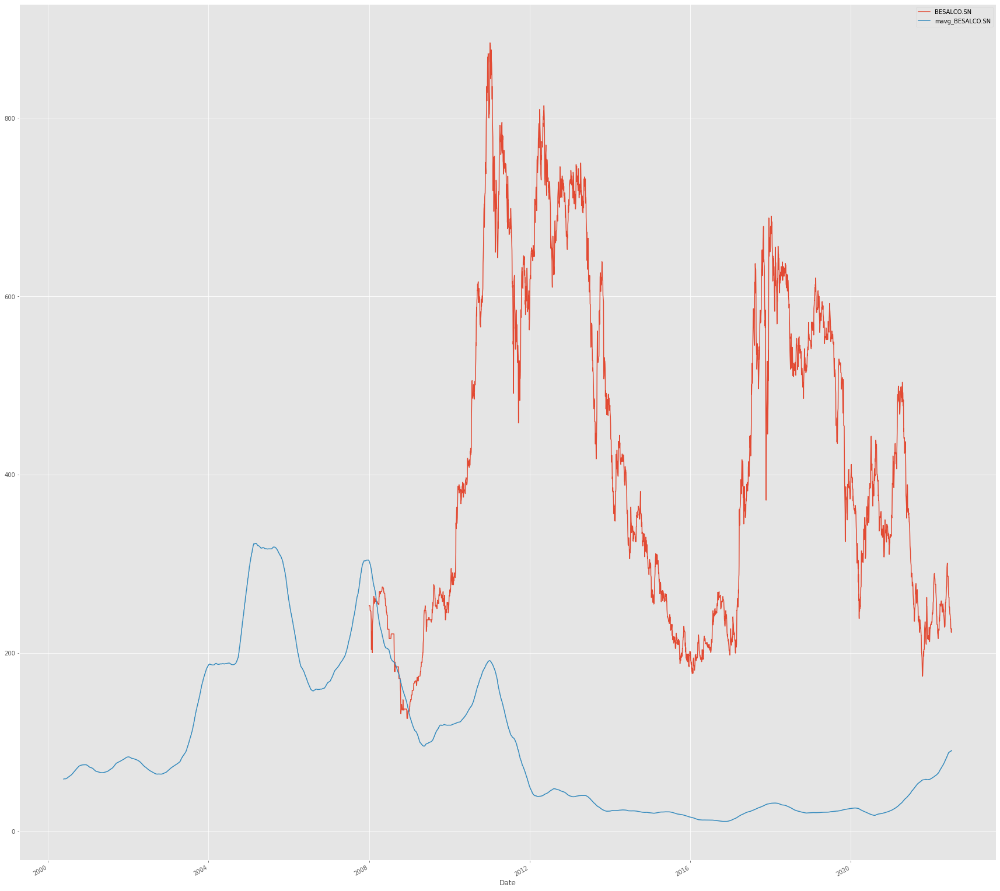

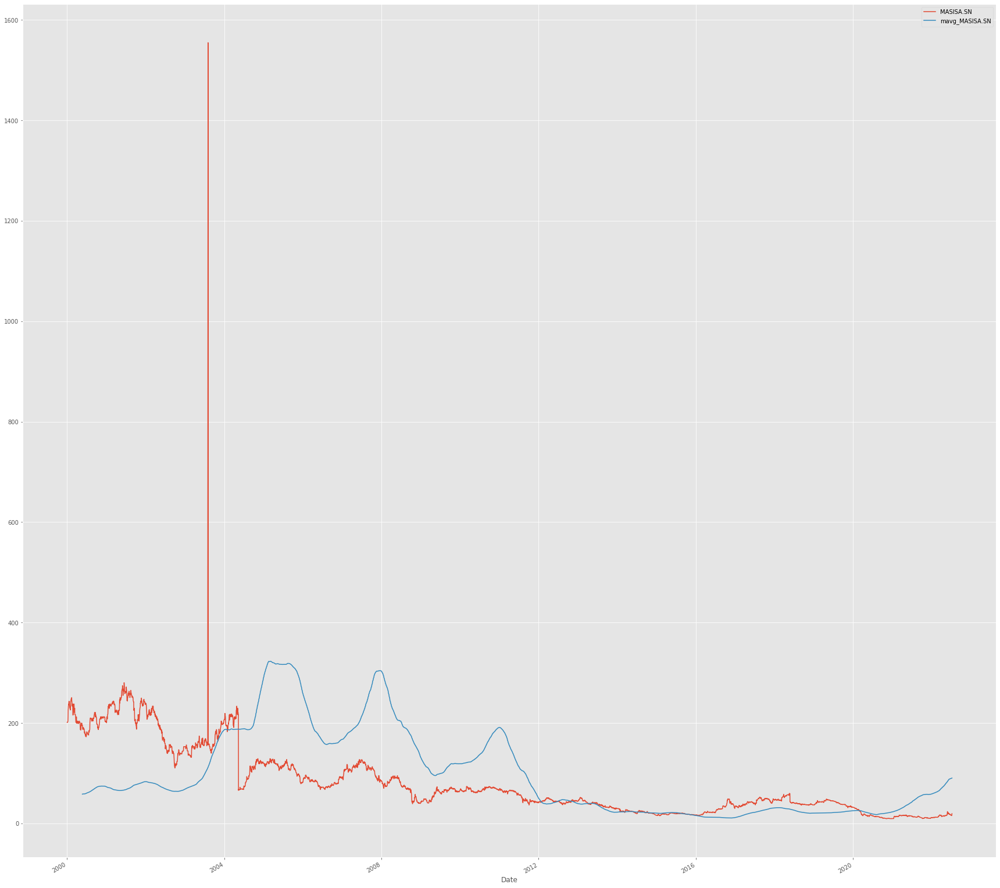

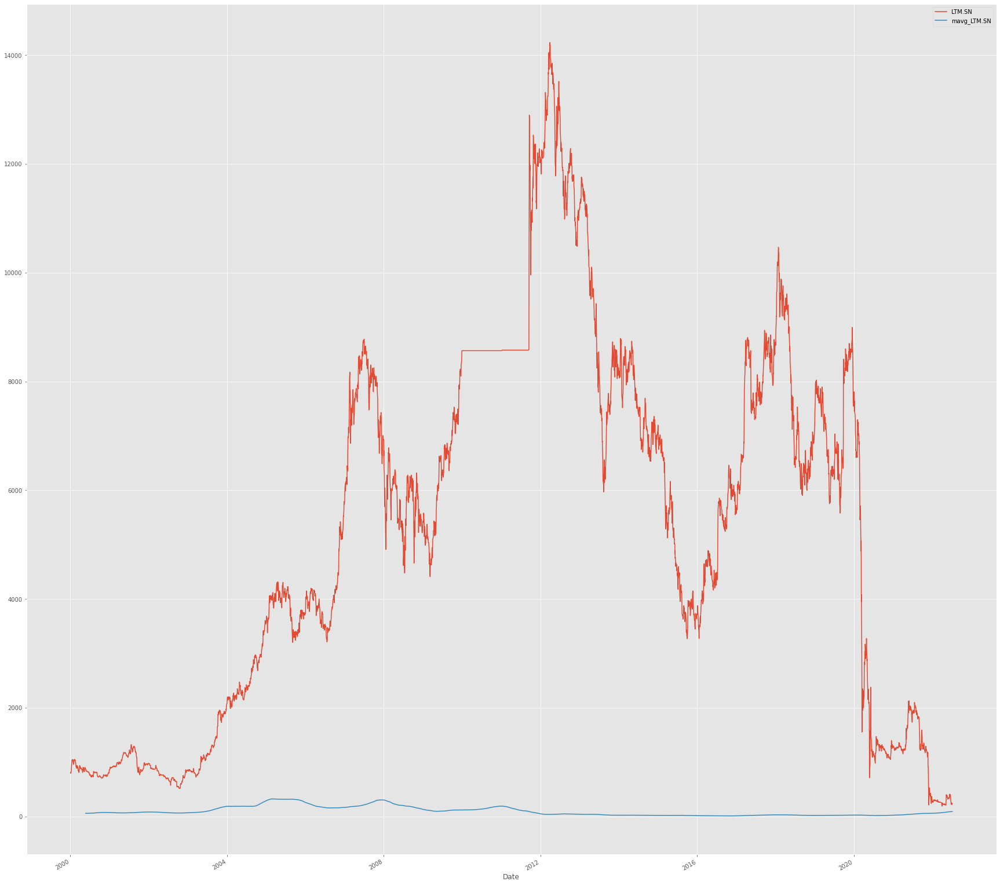

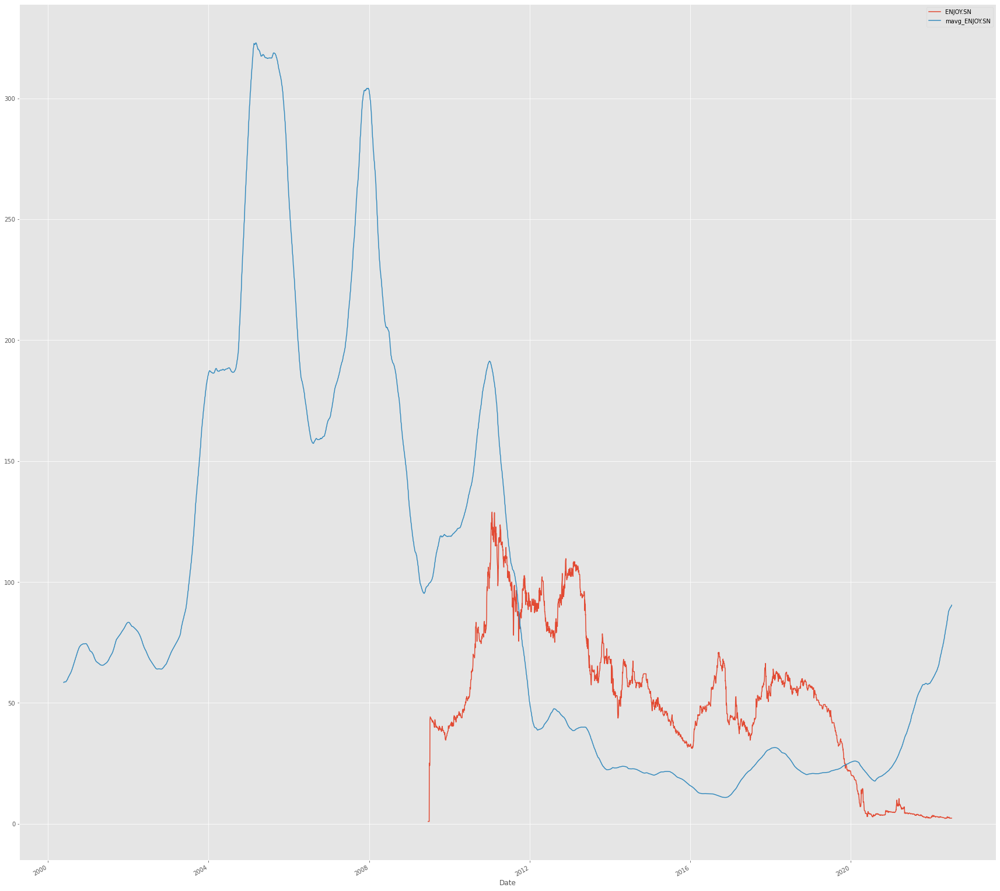

In [90]:
for i in ipsa:
  %matplotlib inline
  import matplotlib.pyplot as plt
  from matplotlib import style

  # Adjusting the size of matplotlib
  import matplotlib as mpl
  mpl.rc('figure', figsize=(30, 30))
  mpl.__version__

  # Adjusting the style of matplotlib
  style.use('ggplot')

  globals()["close_px_" + str(i).replace(".","")].plot(label=i)
  globals()["mavg" + str(i).replace(".","")].plot(label='mavg_'+i)
  plt.legend()
  plt.show()


Returns defined as: 
$$ $$
$$r_t = \frac{p_t - p_{t-1}}{p_{t-1}} = \frac{p_t}{p_{t-1}} - 1$$

In [91]:
rets = close_px / close_px.shift(1) - 1
rets.head()

# close_px.pct_change().head()

Date
2000-01-05         NaN
2000-01-06    0.000000
2000-01-07    0.050000
2000-01-10    0.082251
2000-01-11    0.048000
Name: Adj Close, dtype: float64

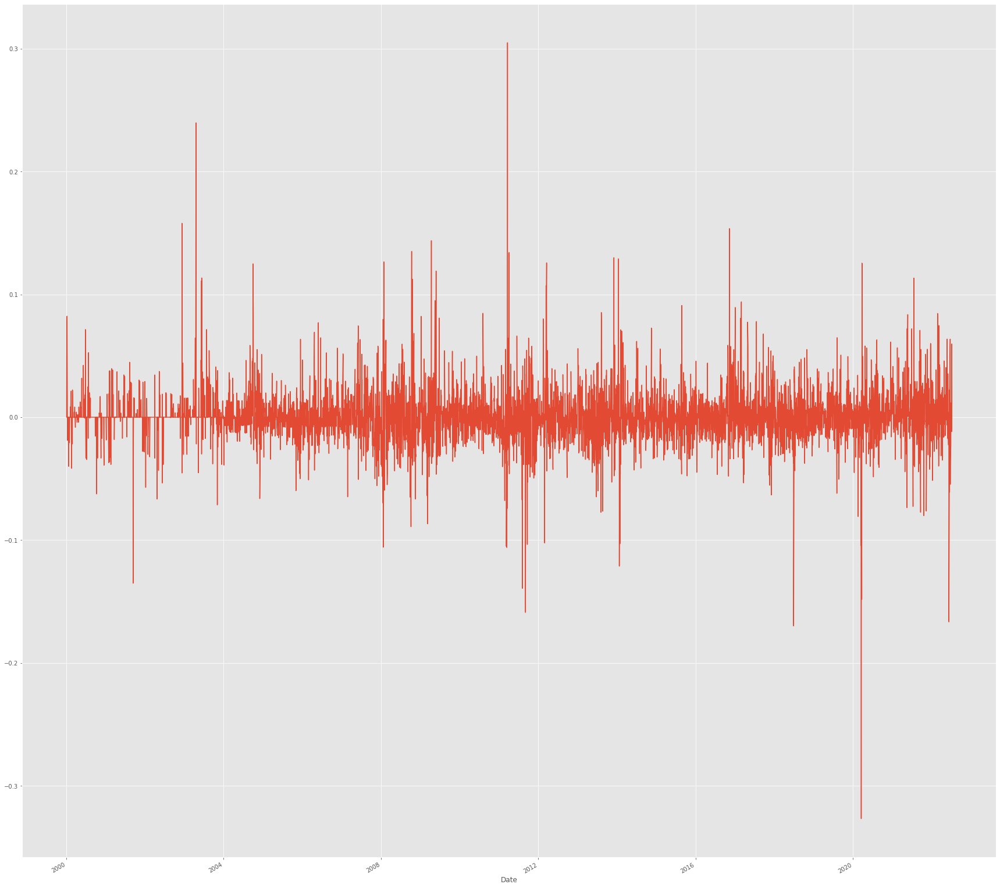

In [92]:
rets.plot(label='return')

## Doing the competitor analysis/Correlation

1. How does one company perform in relative with its competitor
2. What are the correlations among these companies

In [93]:

dfcomp = web.DataReader(ipsa,'yahoo',
                               start=start, 
                               end=end)['Adj Close']
dfcomp.tail()

Symbols,HLAG.DE,MAERSK-B.CO,VALE,INVERCAP.SN,SQM-B.SN,CHILE.SN,BSANTANDER.SN,COPEC.SN,CENCOSUD.SN,FALABELLA.SN,...,SMU.SN,ECL.SN,SONDA.SN,RIPLEY.SN,SECURITY.SN,QUINENCO.SN,BESALCO.SN,MASISA.SN,LTM.SN,ENJOY.SN
Date,,,,,,,,,,,,,,,,,,,,,
2022-07-04,244.000000,16655.0,NaN,2341.359131,77731.718750,84.360001,37.939999,6912.0,1189.000000,2033.127686,...,82.544472,350.160004,267.574158,147.839996,124.472580,2202.600098,227.249664,15.90,224.710007,2.364
2022-07-05,248.600006,16045.0,13.113789,2341.359131,78764.921875,82.599998,37.250000,6950.0,1190.000000,2033.621460,...,82.544472,348.899994,270.753845,150.500000,124.913475,2180.000000,223.689331,15.62,218.699997,2.328
2022-07-06,251.199997,16110.0,13.113789,2333.898193,78804.140625,83.000000,36.880001,6850.0,1190.400024,2011.892700,...,83.612694,338.779999,264.973511,153.000000,124.683441,2196.000000,222.890472,15.85,239.770004,2.304
2022-07-07,272.399994,17255.0,13.779463,2401.906494,82976.179688,82.769997,36.500000,6910.0,1221.099976,1999.052856,...,84.409004,337.100006,267.996155,149.500000,124.817619,2215.000000,226.746689,18.00,231.240005,2.320
2022-07-08,281.399994,17710.0,13.551231,2389.089111,82482.117188,83.000000,36.910000,7000.0,1235.000000,1963.496582,...,84.952835,338.279999,267.996155,149.039993,124.597183,2261.000000,226.746689,19.58,236.199997,2.320


Get the dimension of dataframes

In [94]:
dfcomp.shape

(5839, 37)

In [95]:
retscomp = dfcomp.pct_change()

corr = retscomp.corr()
corr

Symbols,HLAG.DE,MAERSK-B.CO,VALE,INVERCAP.SN,SQM-B.SN,CHILE.SN,BSANTANDER.SN,COPEC.SN,CENCOSUD.SN,FALABELLA.SN,...,SMU.SN,ECL.SN,SONDA.SN,RIPLEY.SN,SECURITY.SN,QUINENCO.SN,BESALCO.SN,MASISA.SN,LTM.SN,ENJOY.SN
Symbols,,,,,,,,,,,,,,,,,,,,,
HLAG.DE,1.000000,0.366164,0.109622,0.034047,0.105770,0.067730,0.081609,0.057235,0.011845,0.094402,...,0.061930,0.044373,0.080647,0.031972,0.084939,0.082085,0.051978,0.052601,0.003649,0.052920
MAERSK-B.CO,0.366164,1.000000,0.312265,0.105635,0.200669,0.172970,0.205312,0.177222,0.160788,0.172788,...,0.142625,0.110810,0.170541,0.184775,0.112013,0.105853,0.148536,0.024888,0.134484,-0.022540
VALE,0.109622,0.312265,1.000000,0.148560,0.361377,0.236809,0.292833,0.276118,0.236175,0.256627,...,0.131743,0.151953,0.214502,0.234091,0.118602,0.129146,0.146461,0.017988,0.176779,-0.010068
INVERCAP.SN,0.034047,0.105635,0.148560,1.000000,0.146241,0.132114,0.126314,0.137711,0.115453,0.135457,...,0.133924,0.102117,0.116684,0.149348,0.118979,0.096115,0.127679,0.019806,0.080823,0.004731
SQM-B.SN,0.105770,0.200669,0.361377,0.146241,1.000000,0.339568,0.358998,0.347745,0.305982,0.331904,...,0.230842,0.164084,0.293498,0.255474,0.177655,0.184886,0.210911,0.036474,0.210100,0.030648
CHILE.SN,0.067730,0.172970,0.236809,0.132114,0.339568,1.000000,0.587384,0.489804,0.461428,0.479084,...,0.432872,0.398837,0.387561,0.380481,0.304331,0.261709,0.290967,0.230141,0.200790,0.007821
BSANTANDER.SN,0.081609,0.205312,0.292833,0.126314,0.358998,0.587384,1.000000,0.447153,0.407882,0.432684,...,0.377995,0.269126,0.367708,0.375784,0.293364,0.241341,0.287105,0.030279,0.261618,0.011691
COPEC.SN,0.057235,0.177222,0.276118,0.137711,0.347745,0.489804,0.447153,1.000000,0.416551,0.479556,...,0.344038,0.235866,0.376990,0.412979,0.245633,0.251991,0.283952,0.049056,0.228570,0.006894
CENCOSUD.SN,0.011845,0.160788,0.236175,0.115453,0.305982,0.461428,0.407882,0.416551,1.000000,0.454353,...,0.383467,0.206991,0.381111,0.438784,0.266145,0.189445,0.289756,0.044963,0.227862,0.004391


In [96]:
#plt.scatter(retscomp.CAP.SN, retscomp.VAPORES.SN)
#plt.xlabel('Returns CAP.SN')
#plt.ylabel('Returns VAPORES.SN')

You can do scatter matrix with all the competitors data and find the kde of each m
KDE will determine if your chart is more normally distributed leaning to the 
* left: Returns are more likely to be negative in the long run
* centre: Returns are more likely to be 0 in the long run
* right: Returns are more likely to be positive in the long run

In [97]:
pip install matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [98]:
#pd.plotting.scatter_matrix(retscomp, diagonal='kde', figsize=(600, 600));

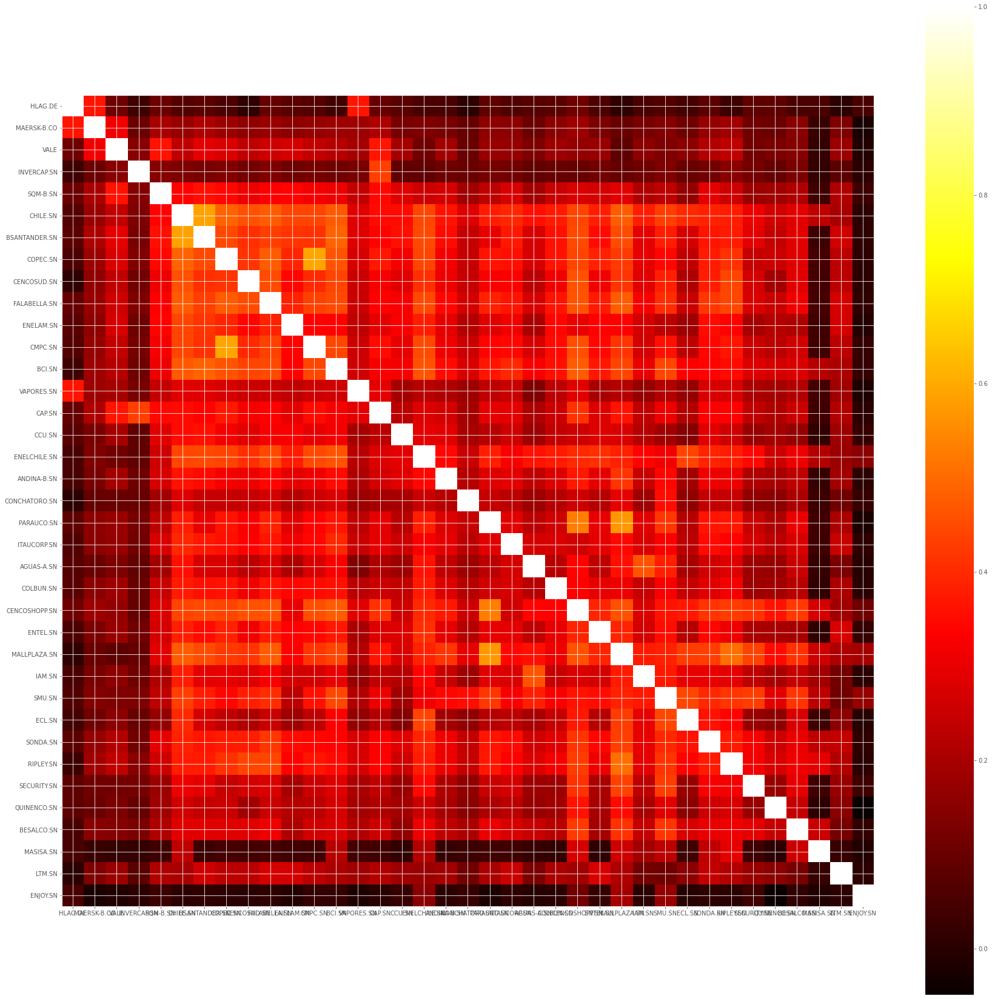

In [99]:
plt.imshow(corr, cmap='hot', interpolation='none')
plt.colorbar()
plt.xticks(range(len(corr)), corr.columns)
plt.yticks(range(len(corr)), corr.columns);

[texto del vínculo](https://)## Stocks mean and Risk calculation
Which stocks are risky and bearing returns

Kurtosis and skewness

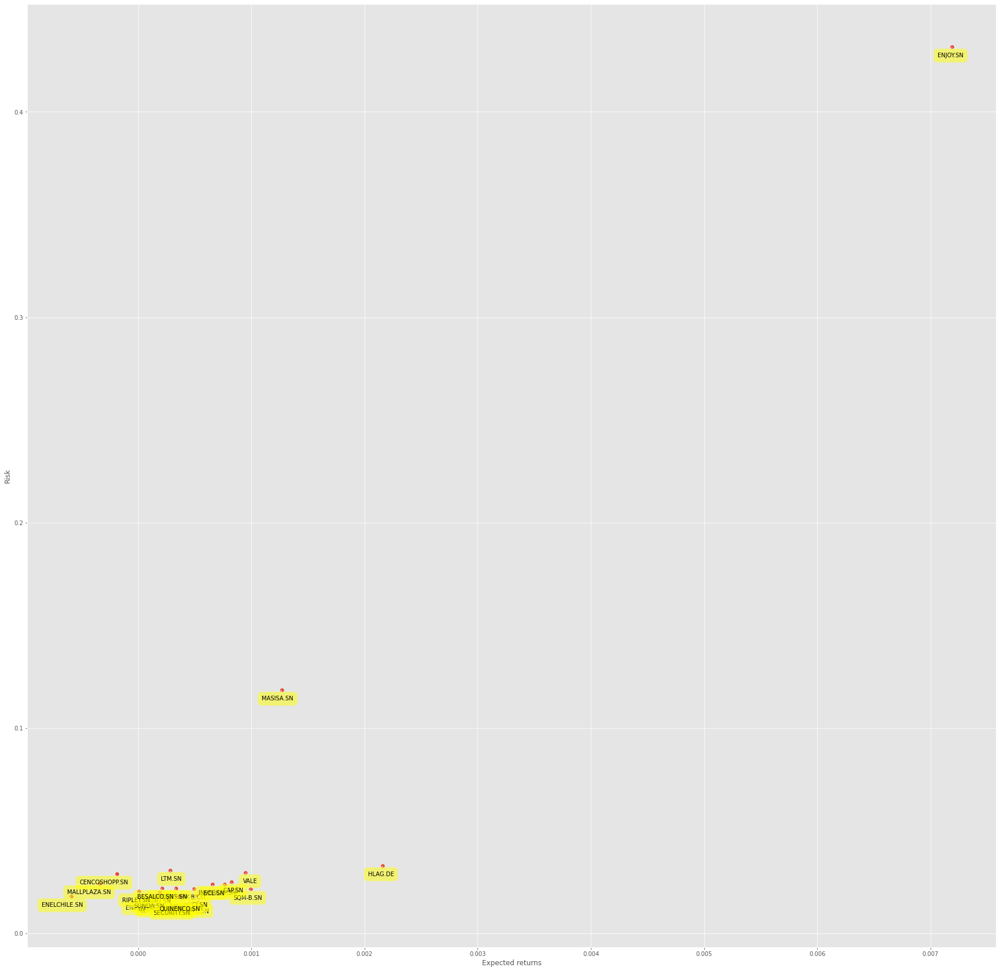

In [100]:
plt.scatter(retscomp.mean(), retscomp.std())
plt.xlabel('Expected returns')
plt.ylabel('Risk')
for label, x, y in zip(retscomp.columns, retscomp.mean(), retscomp.std()):
    plt.annotate(
        label, 
        xy = (x, y), xytext = (20, -20),
        textcoords = 'offset points', ha = 'right', va = 'bottom',
        bbox = dict(boxstyle = 'round,pad=0.7', fc = 'yellow', alpha = 0.5),
        arrowprops = dict(arrowstyle = '->', connectionstyle = 'arc3,rad=0'))

# Predicting the stocks price

To predict the return of the stocks in the next period - Prediction analysis
* Simple Linear Analysis
* Quadratic Linear Analysis (QDA)
* K Nearest Neighbor (KNN)

But first, let us extract the necessary columns first from df:
* Adj Close
* Adj Volume
* HL Percentage
* PCT Change

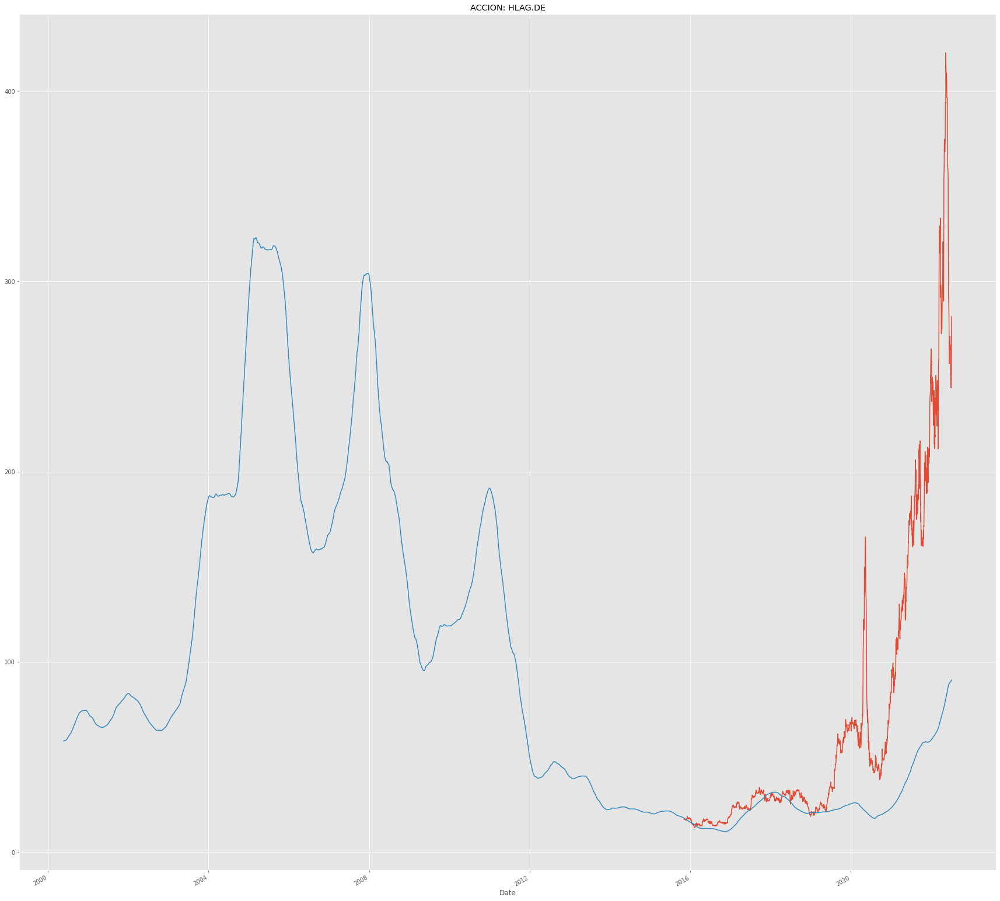

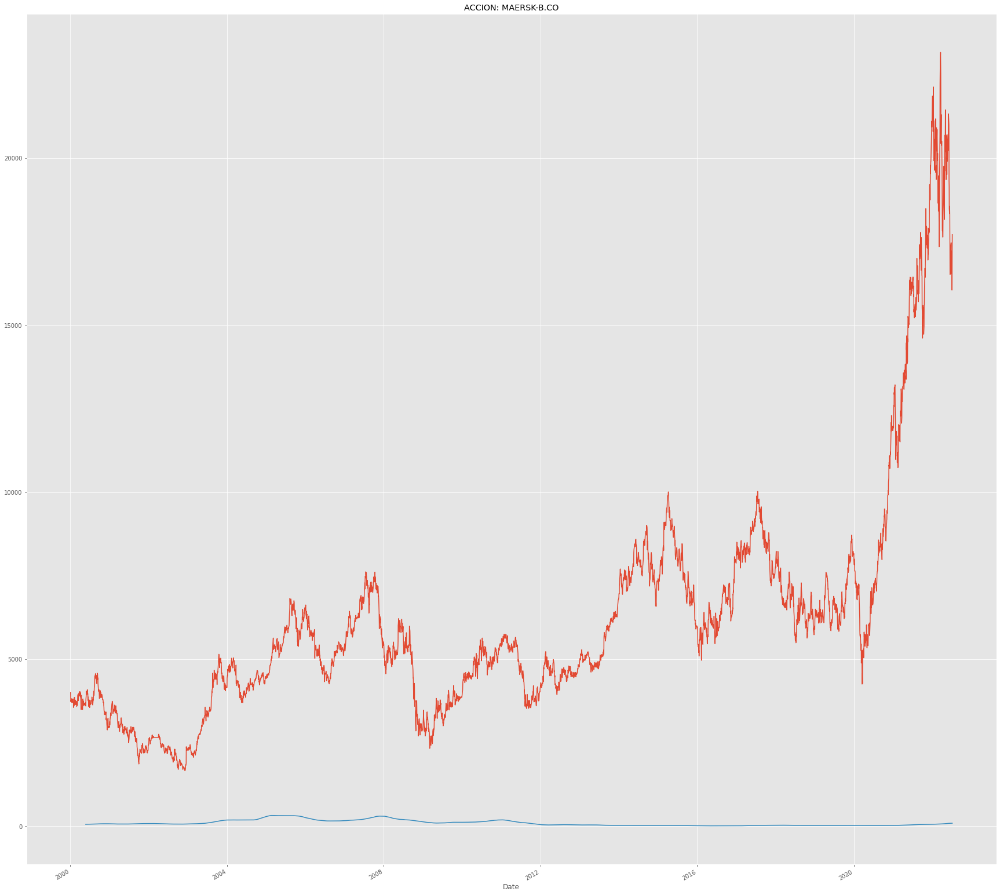

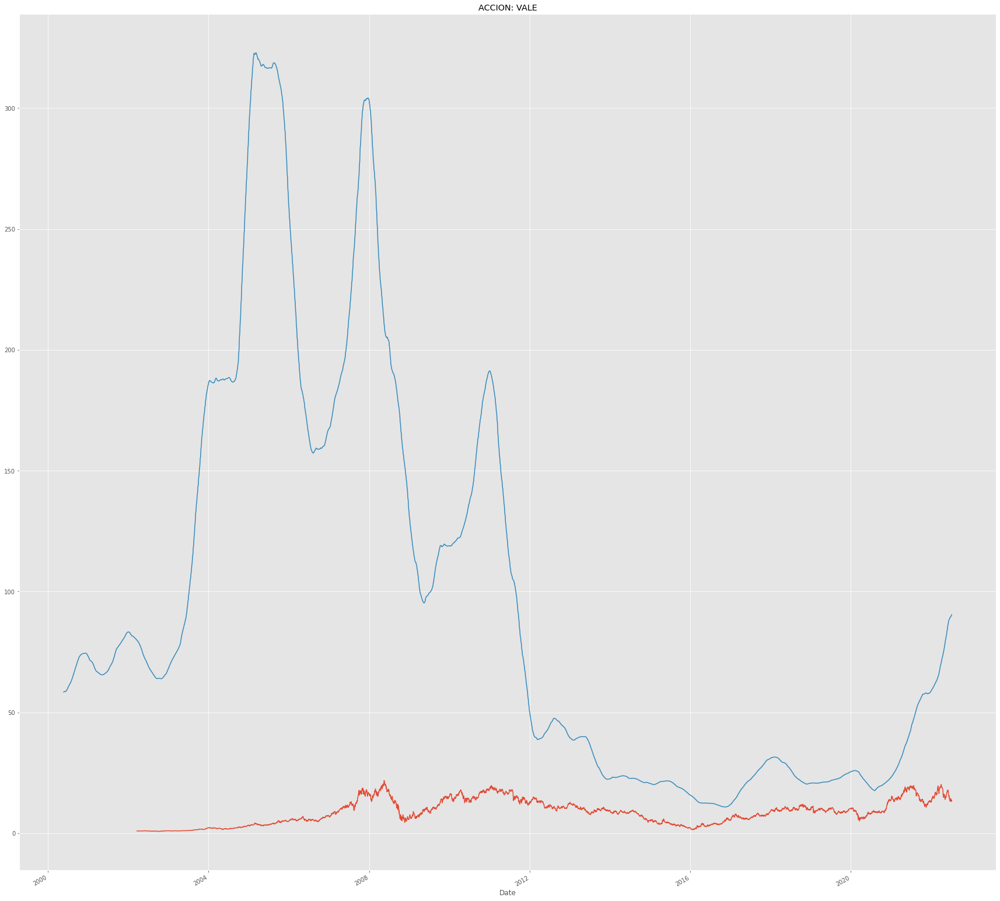

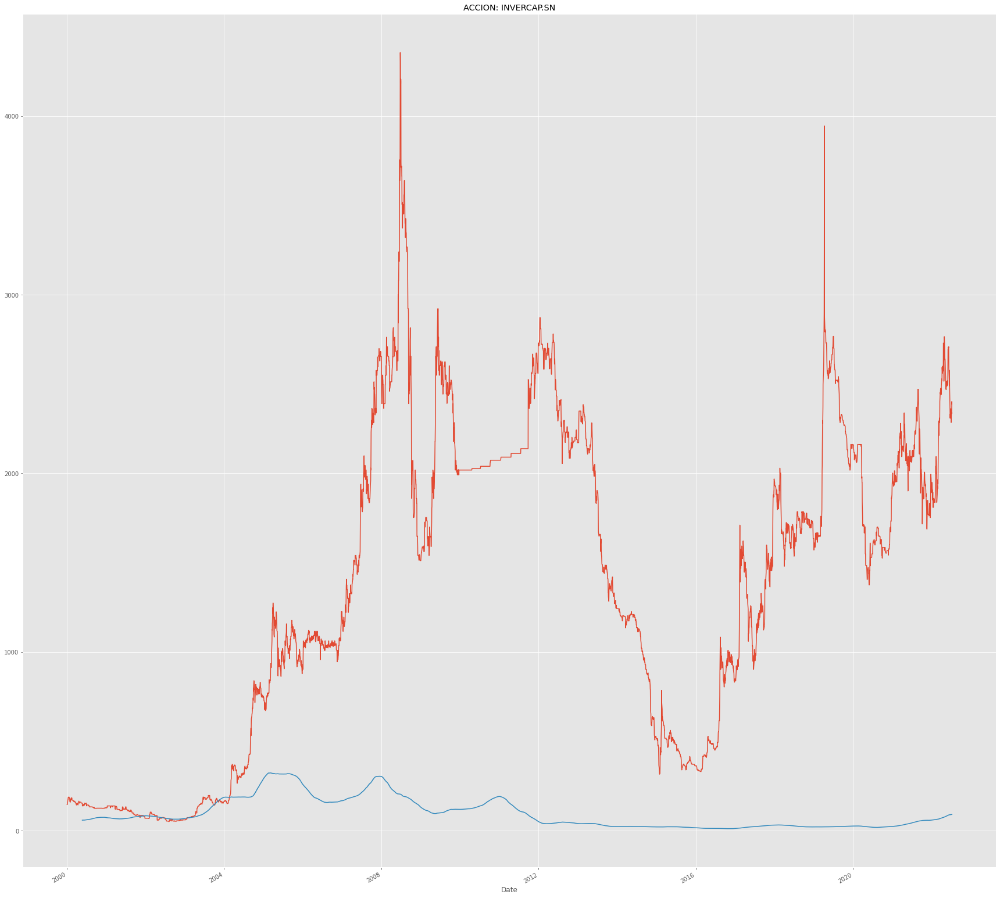

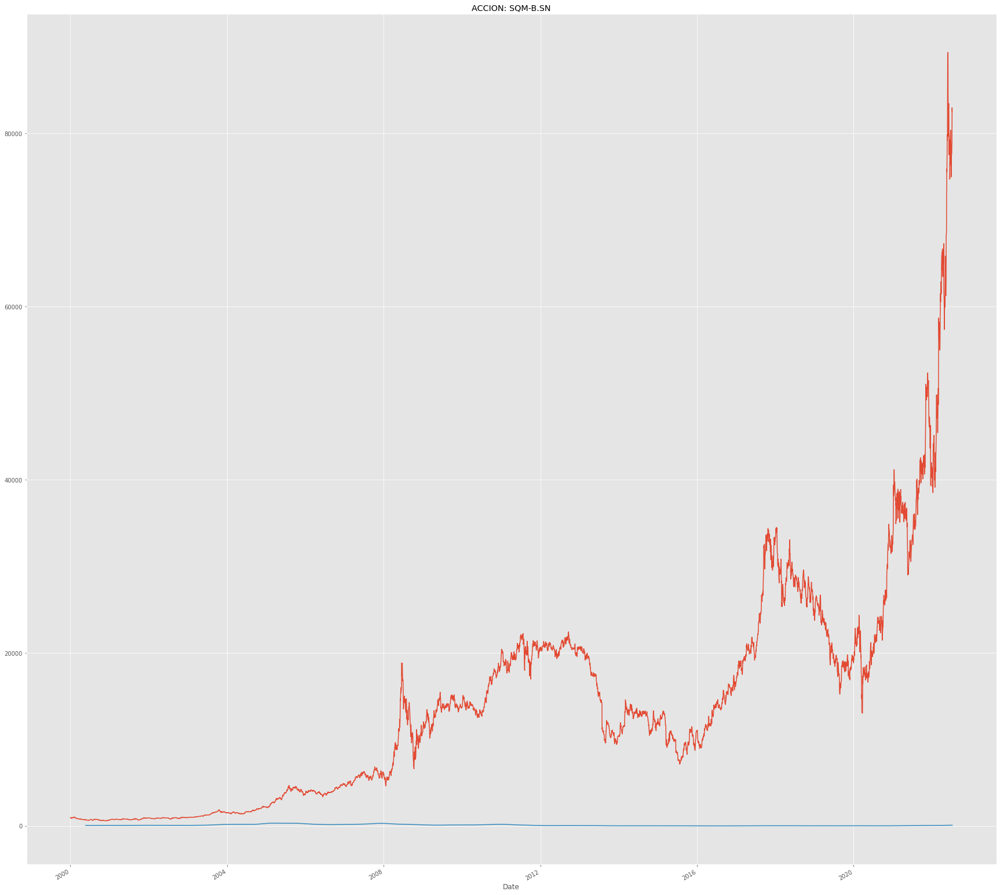

...

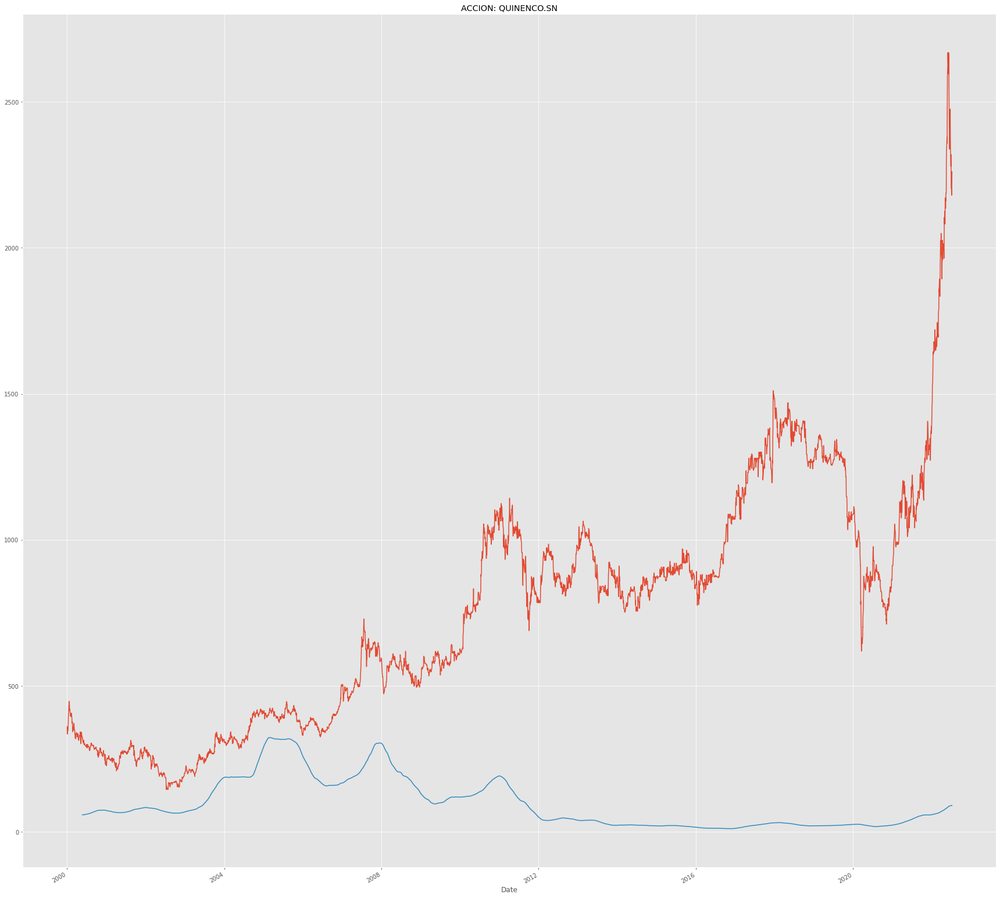

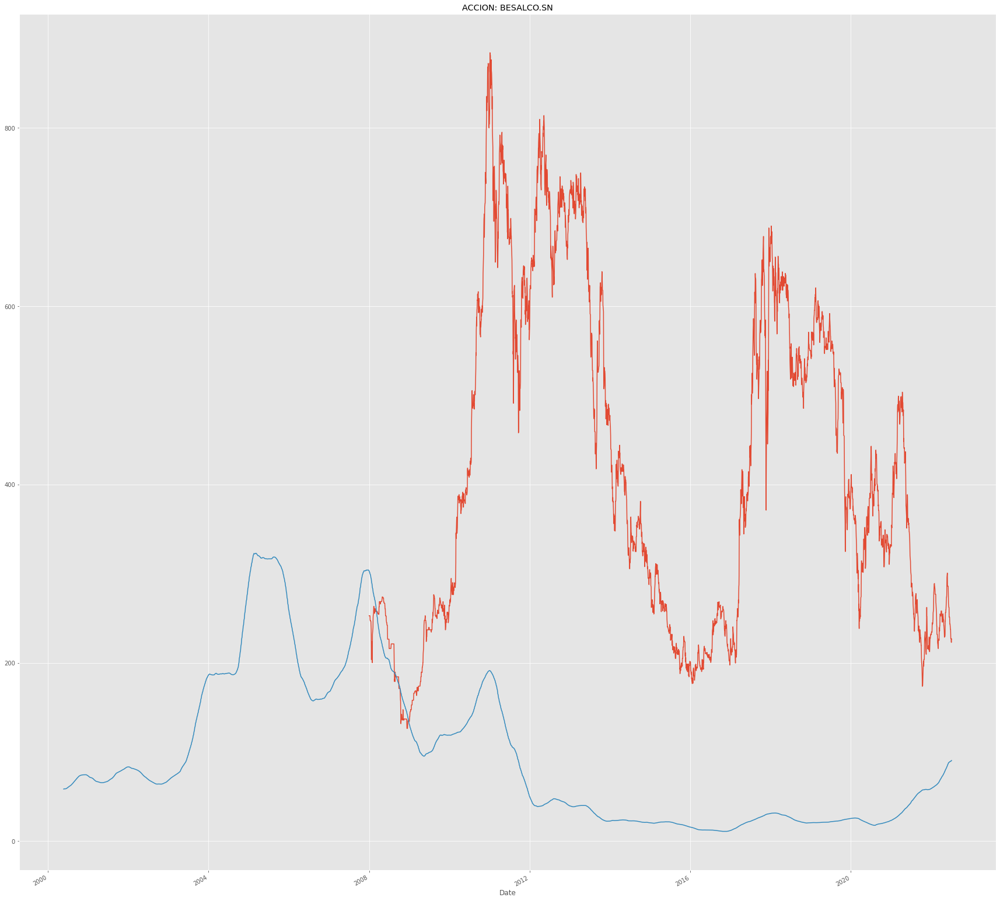

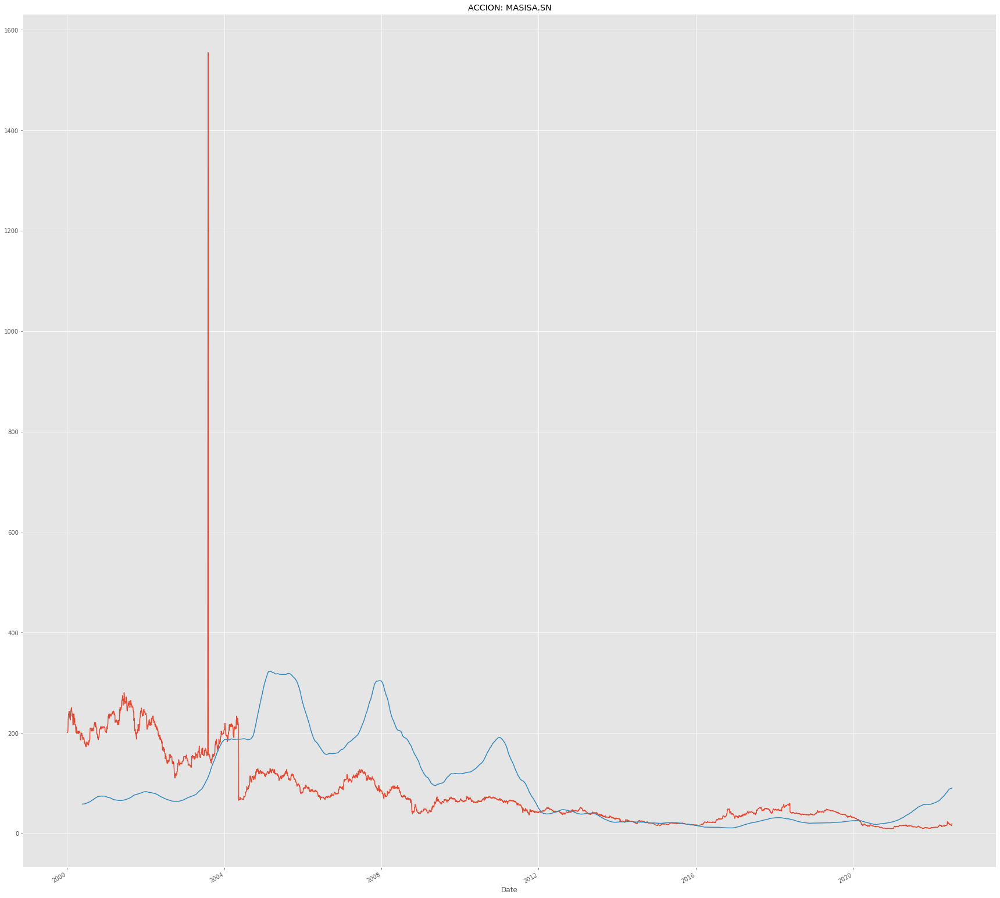

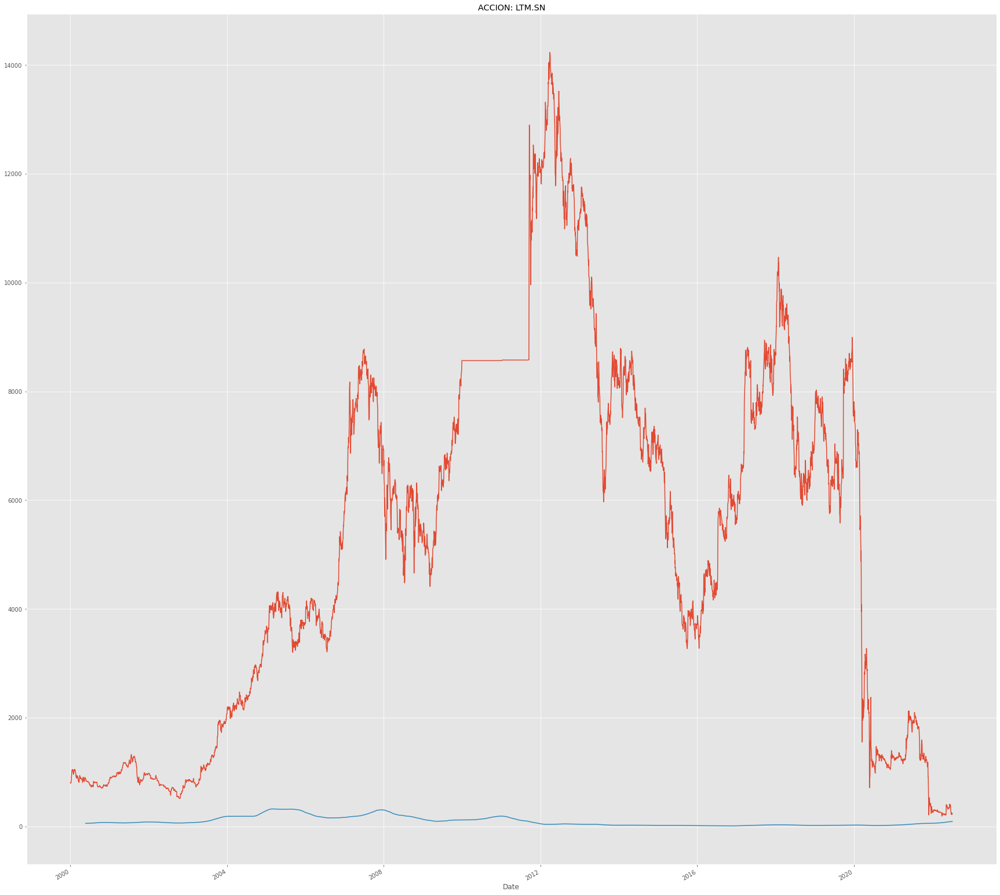

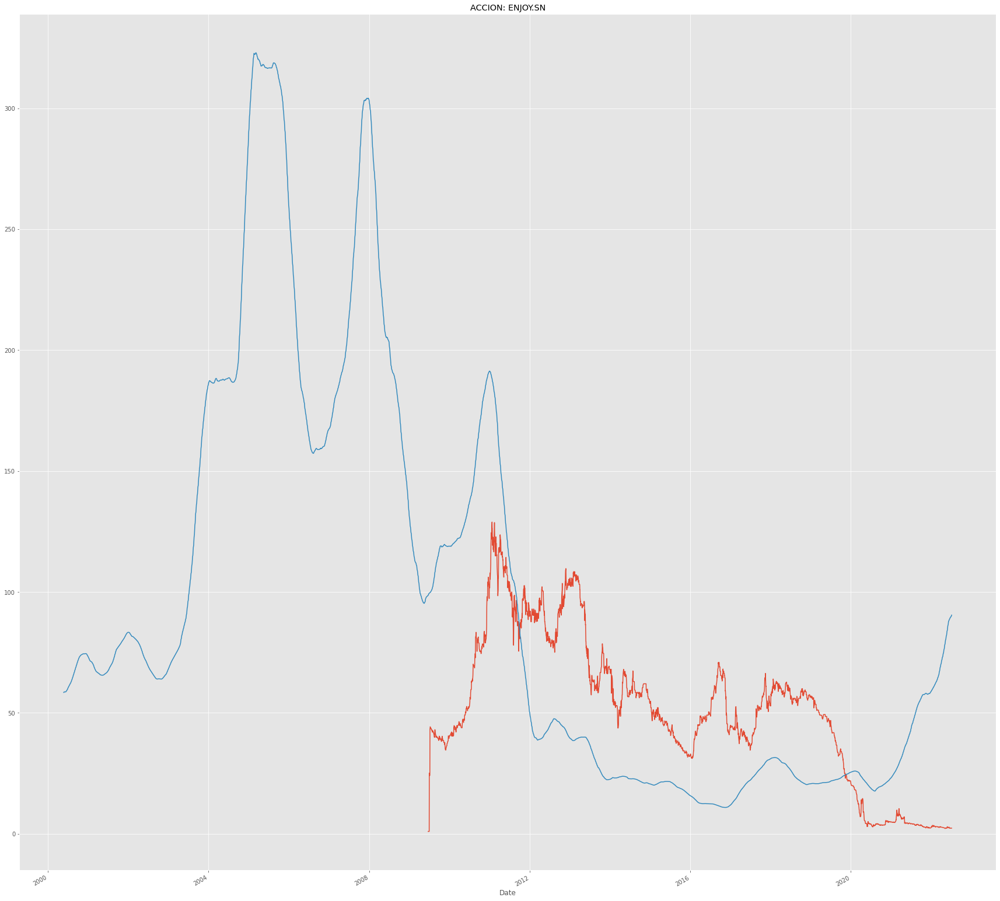

In [101]:
for i in ipsa:
  globals()["close_px_" + str(i).replace(".","")].plot(label=i)
  globals()["mavg" + str(i).replace(".","")].plot(label='mavg_'+i)

  globals()[str(i).replace(".","")].head()
  plt.title("ACCION: "+ str(i))
  plt.show()

In [102]:
for i in ipsa:
  globals()[str(dfreg)+str(i).replace(".","")] = globals()[str(i).replace(".","")].loc[:,['Adj Close','Volume']]
  globals()[str(dfreg)+str(i).replace(".","")]['HL_PCT'] = (df['High'] - df['Low']) / df['Close'] * 100.0
  globals()[str(dfreg)+str(i).replace(".","")]['PCT_change'] = (df['Close'] - df['Open']) / df['Open'] * 100.0
  globals()[str(dfreg)+str(i).replace(".","")].head()

In [103]:
import math
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

for i in ipsa:

  # Drop missing value
  globals()[str(dfreg)+str(i).replace(".","")].fillna(value=-99999, inplace=True)

  print(globals()[str(dfreg)+str(i).replace(".","")].shape)
  # We want to separate 1 percent of the data to forecast
  forecast_out = int(math.ceil(0.01 * len(globals()[str(dfreg)+str(i).replace(".","")])))

  # Separating the label here, we want to predict the AdjClose
  forecast_col = 'Adj Close'
  globals()[str(dfreg)+str(i).replace(".","")]['label'] = dfreg[forecast_col].shift(-forecast_out)
  X = np.array(globals()[str(dfreg)+str(i).replace(".","")].drop(['label'], 1))

  # Scale the X so that everyone can have the same distribution for linear regression
  X = preprocessing.scale(X)

  # Finally We want to find Data Series of late X and early X (train) for model generation and evaluation
  X_lately = X[-forecast_out:]
  X = X[:-forecast_out]

  # Separate label and identify it as y
  y = np.array(globals()[str(dfreg)+str(i).replace(".","")]['label'])
  y = y[:-forecast_out]

  print('Dimension of X',X.shape)
  print('Dimension of y',y.shape)

(1693, 4)
Dimension of X (1676, 4)
Dimension of y (1676,)
(5695, 4)
Dimension of X (5638, 4)
Dimension of y (5638,)
(5111, 4)
Dimension of X (5059, 4)
Dimension of y (5059,)
(5698, 4)
Dimension of X (5641, 4)
Dimension of y (5641,)
(5709, 4)
Dimension of X (5651, 4)
Dimension of y (5651,)
(3633, 4)
Dimension of X (3596, 4)
Dimension of y (3596,)
(5036, 4)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/pytho

Dimension of X (4985, 4)
Dimension of y (4985,)
(5679, 4)
Dimension of X (5622, 4)
Dimension of y (5622,)
(5709, 4)
Dimension of X (5651, 4)
Dimension of y (5651,)
(5709, 4)
Dimension of X (5651, 4)
Dimension of y (5651,)
(5707, 4)
Dimension of X (5649, 4)
Dimension of y (5649,)
(5709, 4)
Dimension of X (5651, 4)
Dimension of y (5651,)
(3633, 4)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/pytho

Dimension of X (3596, 4)
Dimension of y (3596,)
(5697, 4)
Dimension of X (5640, 4)
Dimension of y (5640,)
(5705, 4)
Dimension of X (5647, 4)
Dimension of y (5647,)
(5709, 4)
Dimension of X (5651, 4)
Dimension of y (5651,)
(1548, 4)
Dimension of X (1532, 4)
Dimension of y (1532,)
(5616, 4)
Dimension of X (5559, 4)
Dimension of y (5559,)
(5707, 4)
Dimension of X (5649, 4)
Dimension of y (5649,)
(5709, 4)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/pytho

Dimension of X (5651, 4)
Dimension of y (5651,)
(4953, 4)
Dimension of X (4903, 4)
Dimension of y (4903,)
(5709, 4)
Dimension of X (5651, 4)
Dimension of y (5651,)
(5709, 4)
Dimension of X (5651, 4)
Dimension of y (5651,)
(757, 4)
Dimension of X (749, 4)
Dimension of y (749,)
(5709, 4)
Dimension of X (5651, 4)
Dimension of y (5651,)
(984, 4)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_data.py:236: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  "Numerical issues were encountered "
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments 

Dimension of X (974, 4)
Dimension of y (974,)
(4177, 4)
Dimension of X (4135, 4)
Dimension of y (4135,)
(1358, 4)
Dimension of X (1344, 4)
Dimension of y (1344,)
(5703, 4)
Dimension of X (5645, 4)
Dimension of y (5645,)
(3928, 4)
Dimension of X (3888, 4)
Dimension of y (3888,)
(4269, 4)
Dimension of X (4226, 4)
Dimension of y (4226,)
(5709, 4)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/pytho

Dimension of X (5651, 4)
Dimension of y (5651,)
(5709, 4)
Dimension of X (5651, 4)
Dimension of y (5651,)
(3633, 4)
Dimension of X (3596, 4)
Dimension of y (3596,)
(5709, 4)
Dimension of X (5651, 4)
Dimension of y (5651,)
(5709, 4)
Dimension of X (5651, 4)
Dimension of y (5651,)
(3254, 4)
Dimension of X (3221, 4)
Dimension of y (3221,)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only


In [104]:
# Separation of training and testing of model by cross validation train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Model Generation

* To predict the return of the stocks in the next period - Prediction analysis
    * Simple Linear Analysis
    * Quadratic Linear Analysis (QDA)
    * K Nearest Neighbor (KNN)

## Build the model

In [105]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
import datetime


from sklearn.linear_model import Ridge
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

# Linear regression
clfreg = LinearRegression(n_jobs=-1)
clfreg.fit(X_train, y_train)


# Quadratic Regression 2
clfpoly2 = make_pipeline(PolynomialFeatures(2), Ridge())
clfpoly2.fit(X_train, y_train)

# Quadratic Regression 3
clfpoly3 = make_pipeline(PolynomialFeatures(3), Ridge())
clfpoly3.fit(X_train, y_train)
    
# KNN Regression
clfknn = KNeighborsRegressor(n_neighbors=2)
clfknn.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=2)

## Test the model

In [106]:
confidencereg = clfreg.score(X_test, y_test)
confidencepoly2 = clfpoly2.score(X_test,y_test)
confidencepoly3 = clfpoly3.score(X_test,y_test)
confidenceknn = clfknn.score(X_test, y_test)

print("The linear regression confidence is ",confidencereg)
print("The quadratic regression 2 confidence is ",confidencepoly2)
print("The quadratic regression 3 confidence is ",confidencepoly3)
print("The knn regression confidence is ",confidenceknn)

The linear regression confidence is  0.06160375174595567
The quadratic regression 2 confidence is  0.06699473322028193
The quadratic regression 3 confidence is  0.09306875633347733
The knn regression confidence is  0.0031699569522423143


This means that the linear regression holds the most accuracy of it as being linear and justify the trend of stocks as being linear most of the times. 

However this does not mean we can just put stocks in it. There are still many issues to consider, especially with different companies that have different price trajectories over time. Google really is very linear: Up and to the right. Many companies aren't, so keep this in mind. 

We need to plot out the graph to make the most sense of it 

In [107]:
# Printing the forecast

for i in ipsa:
  forecast_set = clfreg.predict(X_lately)
  globals()[str(dfreg)+str(i).replace(".","")]['Forecast'] = np.nan
  print(forecast_set, confidencereg, forecast_out)

[1209.5879546  1217.6850536  1270.35373699 1201.79203232 1266.6765697
 1573.17360041 1960.12620217 1314.38959293 1369.33290419 1256.81254393
 1200.05234982 1288.49373291 1309.06410063 1331.16621669 1275.94975465
 1301.27583042 1223.27436497 1184.28514619 1226.22215363 1224.30354387
 1351.52381906 1240.6880628  1399.33740503 1249.57784765 1265.14886257
 1205.81583217 1189.80168029 1287.30494439 1130.88005814 1226.17040682
 1288.86600515 1213.35045051 1230.329928  ] 0.06160375174595567 33
[1209.5879546  1217.6850536  1270.35373699 1201.79203232 1266.6765697
 1573.17360041 1960.12620217 1314.38959293 1369.33290419 1256.81254393
 1200.05234982 1288.49373291 1309.06410063 1331.16621669 1275.94975465
 1301.27583042 1223.27436497 1184.28514619 1226.22215363 1224.30354387
 1351.52381906 1240.6880628  1399.33740503 1249.57784765 1265.14886257
 1205.81583217 1189.80168029 1287.30494439 1130.88005814 1226.17040682
 1288.86600515 1213.35045051 1230.329928  ] 0.06160375174595567 33
[1209.5879546  1

# Plotting the Prediction

In [108]:
for x in ipsa:
  last_date = globals()[str(dfreg)+str(x).replace(".","")].iloc[-1].name
  last_unix = last_date
  next_unix = last_unix + datetime.timedelta(days=1)

  for i in forecast_set:
      next_date = next_unix
      next_unix += datetime.timedelta(days=1)
      globals()[str(dfreg)+str(x).replace(".","")].loc[next_date] = [np.nan for _ in range(len(globals()[str(dfreg)+str(i).replace(".","")].columns)-1)]+[i]

KeyError: ignored

In [ ]:
for i in ipsa:
  globals()[str(dfreg)+str(i).replace(".","")]['Adj Close'].tail(100).plot()
  globals()[str(dfreg)+str(i).replace(".","")]['Forecast'].tail(100).plot()
  plt.legend(loc=2)
  plt.xlabel('Fecha')
  plt.ylabel('Precio')
  current_date = datetime.date.today()
  plt.title("Fecha predicción: "+str(current_date) +" / ACCION: "+ str(accion_predecir))
  plt.show()

# Challenges (To Be Continued):
* Assuming economic qualitative factors such as news (news sourcing and sentimental analysis)
* Assuming economic quantitative factors such as HPI of a certain country, economic inequality among origin of company
* Cleaning out the data
* Importing data files

# Next lesson:
## Lesson 4 Basic Python for Data Analytics (Predicting Employee Retention)

# Python: How to Get Live Market Data (Less Than 0.1-Second Lag).
This article is going to be a bit special. I am going to test the latest release from Yahoo Finance API for Python, which provide the possibility to get live data with less than a second lag for free.

Before to start
First of all, if you want to track my progress and before to start, you will need to have installed on your machine a Python 3 version and the following packages:
Pandas
NumPy
Yfinance
Plotly (Not mandatory, but useful for plotting)
If any of these packages are not already installed, you can use the pip command, as shown below.

In [ ]:
!pip install yfinance
!pip install plotly

Once you have ensured that the following packages are installed, we can start.
If you already have experience with Python, you can jump to the second step. The first step will consist of importing data.
I. Import package
The first step will consist of importing the necessary packages.
You will start by importing your packages previously installed by using the following lines of code:

In [ ]:
# Raw Package
import numpy as np
import pandas as pd

#Data Source
import yfinance as yf

#Data viz
import plotly.graph_objs as go


def print_real_time(accion_predecirss):
  #Interval required 1 minute
  accion = accion_predecirss
  data = yf.download(tickers=accion, period='1d', interval='1m')

  #declare figure
  fig = go.Figure()


  #Candlestick
  fig.add_trace(go.Candlestick(x=data.index,
                  open=data['Open'],
                  high=data['High'],
                  low=data['Low'],
                  close=data['Close'], name = 'market data'))

  # Add titles
  fig.update_layout(
      title='EVOLUCIÓN EN VIVO DEL PRECIO DE LA ACCIÓN: '+accion,
      yaxis_title='PRECIO DE LAS ACCION ' + accion)

  # X-Axes
  fig.update_xaxes(
      rangeslider_visible=True,
      rangeselector=dict(
          buttons=list([
              dict(count=15, label="15m", step="minute", stepmode="backward"),
              dict(count=45, label="45m", step="minute", stepmode="backward"),
              dict(count=1, label="HTD", step="hour", stepmode="todate"),
              dict(count=3, label="3h", step="hour", stepmode="backward"),
              dict(step="all")
          ])
      )
  )

  #Show
  fig.show()

  #while True:
    #print(data)

for count, value in enumerate(ipsa):
  print("*********************************************************")
  print(count, value)
  print_real_time(value)
  print("*********************************************************")


In [ ]:
def make_forecast(ticker, periods, hist='max'):
    """
    forecast the given ticker (stock) period days into the future (from today)

    inputs
    ------
    > ticker
        >> ticker of stock to forecast
    > periods
        >> number of days into the future to forecast (from today's date)
    > hist
        >> amount of historical data to consider
            > default: max
            > options: 1d, 5d, 1mo, 3mo, 6mo, 1y, 2y, 5y, 10y, ytd, max
    """
    # pull historical data from yahoo finance
    stock_data = yf.Ticker(ticker)

    hist_data = stock_data.history(hist, auto_adjust=True)

    # create new dataframe to hold dates (ds) & adjusted closing prices (y)
    df = pd.DataFrame()

    df['ds'] = hist_data.index.values
    df['y'] = hist_data['Close'].values

    # create a Prophet model from that data
    m = Prophet(daily_seasonality=False)
    m.fit(df)

    future = m.make_future_dataframe(periods, freq='D')

    forecast = m.predict(future)

    m.plot(forecast)

    #return forecast

In [ ]:
from fbprophet import Prophet

m = Prophet(daily_seasonality=False)



# kkr real estate finance trust
make_forecast('VAPORES.SN', 180)